### Zadania

Lista składa się z dwóch sekcji: pierwsza (zadania 1 i 2) dotyczy metod detekcji krawędzi, druga (zadania 3 i 4) operacji na histogramach.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

##### Zad. 1: Wyznaczenie gradientów

Wykonaj dla obrazu `coins` sztuczny obraz ilustrujący wielkość (moduł) wektora gradientu w danym punkcie. Do wyświetlenia użyj [mapy kolorów](https://matplotlib.org/stable/tutorials/colors/colormaps.html) `hot` do oznaczenia wielkości gradientu odpowiednim kolorem – im większa wartość, tym bardziej czerwony (_mapa ciepła_).  
Gdzie gradienty są bliskie zera?  
Czy uzyskany wynik pozwoliłby np. na detekcję obiektów?

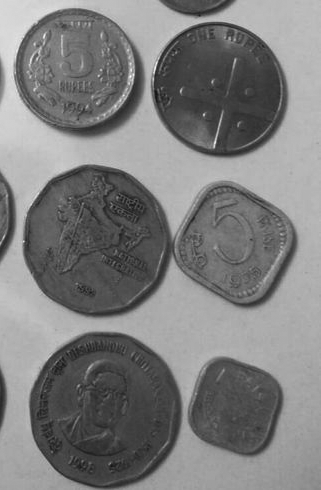

In [2]:
coins = cv2.imread('Monety_szare.bmp', cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins)

In [3]:
def show_image_with_cmap(image, cmap='hot'):
    plt.imshow(image, cmap=cmap)
    plt.colorbar()  
    plt.show()

Rozwiązanie:

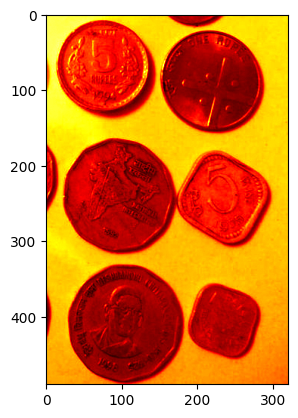

In [4]:
plt.imshow(coins, cmap='hot') # przykład wyświetlania z mapą kolorów

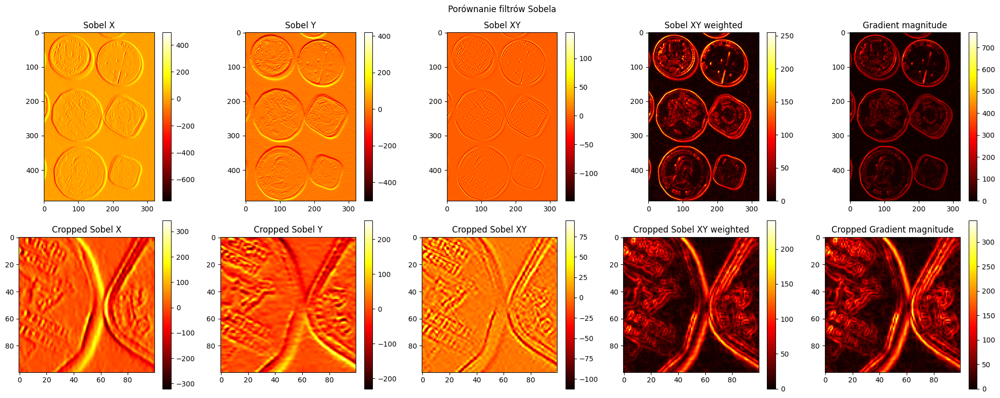

In [5]:
sobelx = cv2.Sobel(coins, cv2.CV_64F, 1, 0, ksize=3)

sobely = cv2.Sobel(coins, cv2.CV_64F, 0, 1, ksize=3)

sobelxy = cv2.Sobel(coins, cv2.CV_64F, 1, 1, ksize=3)

abs_grad_x = cv2.convertScaleAbs(sobelx)
abs_grad_y = cv2.convertScaleAbs(sobely)

grad_xy = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

sobelx = cv2.Sobel(coins, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(coins, cv2.CV_64F, 0, 1, ksize=3)

gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

center_x = coins.shape[1] // 2
center_y = coins.shape[0] // 2

crop_size = 50

f, axarr = plt.subplots(2, 5, figsize=(20, 8))

# Sobel X
im0 = axarr[0, 0].imshow(sobelx, cmap="hot")
f.colorbar(im0, ax=axarr[0, 0])
axarr[0, 0].set_title("Sobel X")

# Sobel Y
im1 = axarr[0, 1].imshow(sobely, cmap="hot")
f.colorbar(im1, ax=axarr[0, 1])
axarr[0, 1].set_title("Sobel Y")

# Sobel XY
im2 = axarr[0, 2].imshow(sobelxy, cmap="hot")
f.colorbar(im2, ax=axarr[0, 2])
axarr[0, 2].set_title("Sobel XY")

# Sobel XY weighted
im3 = axarr[0, 3].imshow(grad_xy, cmap="hot")
f.colorbar(im3, ax=axarr[0, 3])
axarr[0, 3].set_title("Sobel XY weighted")

im4 = axarr[0, 4].imshow(gradient_magnitude, cmap="hot")
f.colorbar(im4, ax=axarr[0, 4])
axarr[0, 4].set_title("Gradient magnitude")


# Cropped Sobel X
crop_sobelx = sobelx[
    center_y - crop_size : center_y + crop_size,
    center_x - crop_size : center_x + crop_size,
]
im4 = axarr[1, 0].imshow(crop_sobelx, cmap="hot")
f.colorbar(im4, ax=axarr[1, 0])
axarr[1, 0].set_title("Cropped Sobel X")

# Cropped Sobel Y
crop_sobely = sobely[
    center_y - crop_size : center_y + crop_size,
    center_x - crop_size : center_x + crop_size,
]
im5 = axarr[1, 1].imshow(crop_sobely, cmap="hot")
f.colorbar(im5, ax=axarr[1, 1])
axarr[1, 1].set_title("Cropped Sobel Y")

# Cropped Sobel XY
crop_sobelxy = sobelxy[
    center_y - crop_size : center_y + crop_size,
    center_x - crop_size : center_x + crop_size,
]
im6 = axarr[1, 2].imshow(crop_sobelxy, cmap="hot")
f.colorbar(im6, ax=axarr[1, 2])
axarr[1, 2].set_title("Cropped Sobel XY")

# Cropped Sobel XY weighted
crop_grad_xy = grad_xy[
    center_y - crop_size : center_y + crop_size,
    center_x - crop_size : center_x + crop_size,
]
im7 = axarr[1, 3].imshow(crop_grad_xy, cmap="hot")
f.colorbar(im7, ax=axarr[1, 3])
axarr[1, 3].set_title("Cropped Sobel XY weighted")

# Cropped Gradient magnitude
crop_gradient_magnitude = gradient_magnitude[
    center_y - crop_size : center_y + crop_size,
    center_x - crop_size : center_x + crop_size,
]
im8 = axarr[1, 4].imshow(crop_gradient_magnitude, cmap="hot")
f.colorbar(im8, ax=axarr[1, 4])
axarr[1, 4].set_title("Cropped Gradient magnitude")

f.suptitle("Porównanie filtrów Sobela")
f.tight_layout()
plt.show()


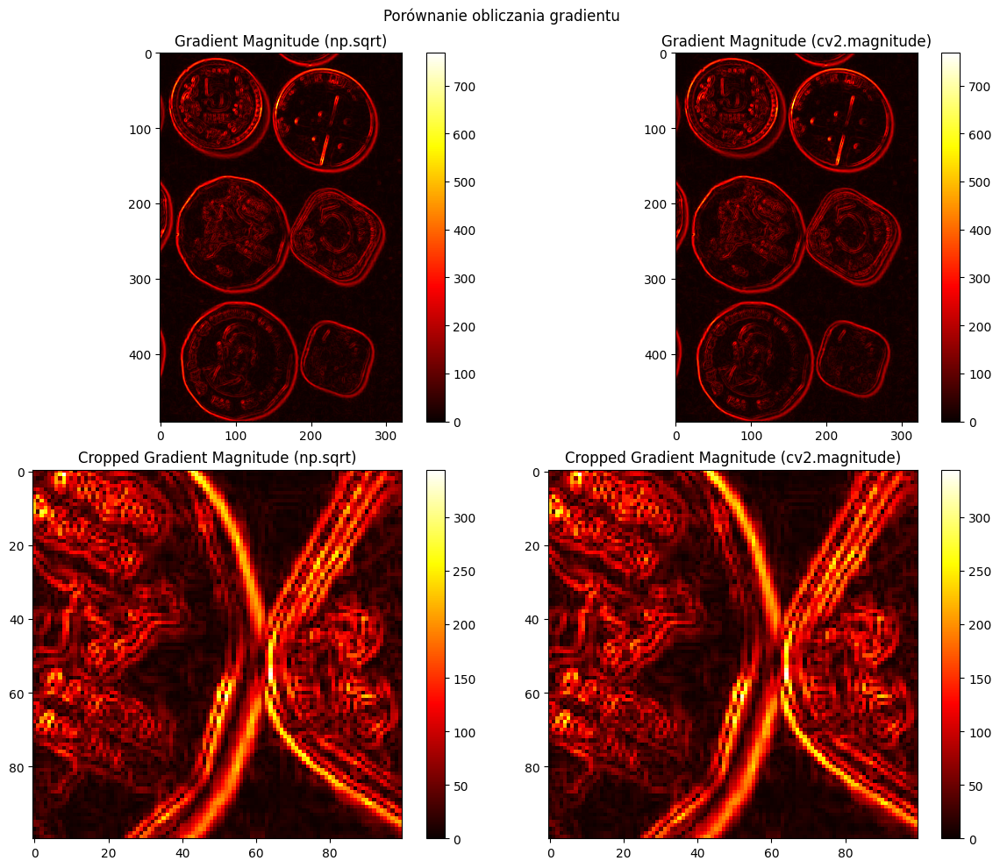

In [7]:
sobelx = cv2.Sobel(coins, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(coins, cv2.CV_64F, 0, 1, ksize=3)

gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)
magnitude = cv2.magnitude(sobelx, sobely)


crop_size = 50

center_x, center_y = gradient_magnitude.shape[1] // 2, gradient_magnitude.shape[0] // 2

crop_gradient_magnitude = gradient_magnitude[center_y - crop_size:center_y + crop_size, center_x - crop_size:center_x + crop_size]
crop_magnitude = magnitude[center_y - crop_size:center_y + crop_size, center_x - crop_size:center_x + crop_size]

f, axarr = plt.subplots(2, 2, figsize=(12, 10))

im0 = axarr[0, 0].imshow(gradient_magnitude, cmap='hot')
f.colorbar(im0, ax=axarr[0, 0])
axarr[0, 0].set_title("Gradient Magnitude (np.sqrt)")

im1 = axarr[0, 1].imshow(magnitude, cmap='hot')
f.colorbar(im1, ax=axarr[0, 1])
axarr[0, 1].set_title("Gradient Magnitude (cv2.magnitude)")

im2 = axarr[1, 0].imshow(crop_gradient_magnitude, cmap='hot')
f.colorbar(im2, ax=axarr[1, 0])
axarr[1, 0].set_title("Cropped Gradient Magnitude (np.sqrt)")

im3 = axarr[1, 1].imshow(crop_magnitude, cmap='hot')
f.colorbar(im3, ax=axarr[1, 1])
axarr[1, 1].set_title("Cropped Gradient Magnitude (cv2.magnitude)")

f.suptitle("Porównanie obliczania gradientu")
f.tight_layout()
plt.show()

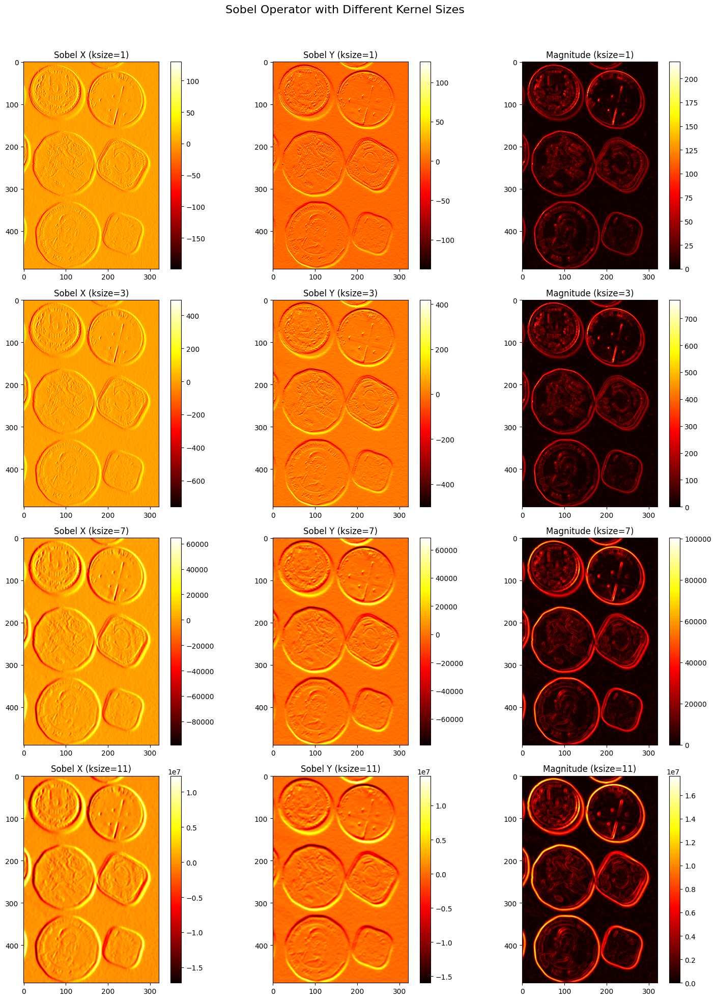

In [9]:
ksizes = [1, 3, 7, 11]

fig, axes = plt.subplots(len(ksizes), 3, figsize=(15, 5 * len(ksizes)))
fig.suptitle('Sobel Operator with Different Kernel Sizes', fontsize=16)

for i, ksize in enumerate(ksizes):
    sobelx = cv2.Sobel(coins, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(coins, cv2.CV_64F, 0, 1, ksize=ksize)
    magnitude = cv2.magnitude(sobelx, sobely)
    
    im0 = axes[i, 0].imshow(sobelx, cmap='hot')
    axes[i, 0].set_title(f'Sobel X (ksize={ksize})')
    fig.colorbar(im0, ax=axes[i, 0])
    
    im1 = axes[i, 1].imshow(sobely, cmap='hot')
    axes[i, 1].set_title(f'Sobel Y (ksize={ksize})')
    fig.colorbar(im1, ax=axes[i, 1])
    
    im2 = axes[i, 2].imshow(magnitude, cmap='hot')
    axes[i, 2].set_title(f'Magnitude (ksize={ksize})')
    fig.colorbar(im2, ax=axes[i, 2])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

---

##### Zad. 2: Detekcja krawędzi

Przeprowadź z obrazem `coins_noise` takie przekształcenia, aby zmaksymalizować możliwość rozpoznania obiektów. Wykorzystaj [filtr Canny'ego](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga04723e007ed888ddf11d9ba04e2232de) do detekcji krawędzi; zbadaj jego zachowanie w zależności od wartości progów oraz sposobu redukcji szumu.

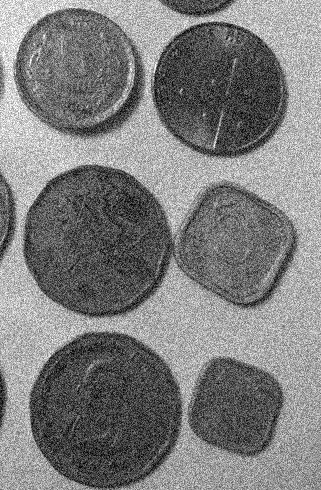

In [11]:
coins_noise = cv2.imread('Monety_szare_szum.bmp', cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins_noise)

Rozwiązanie:

Badanie wartości progów ze szumem

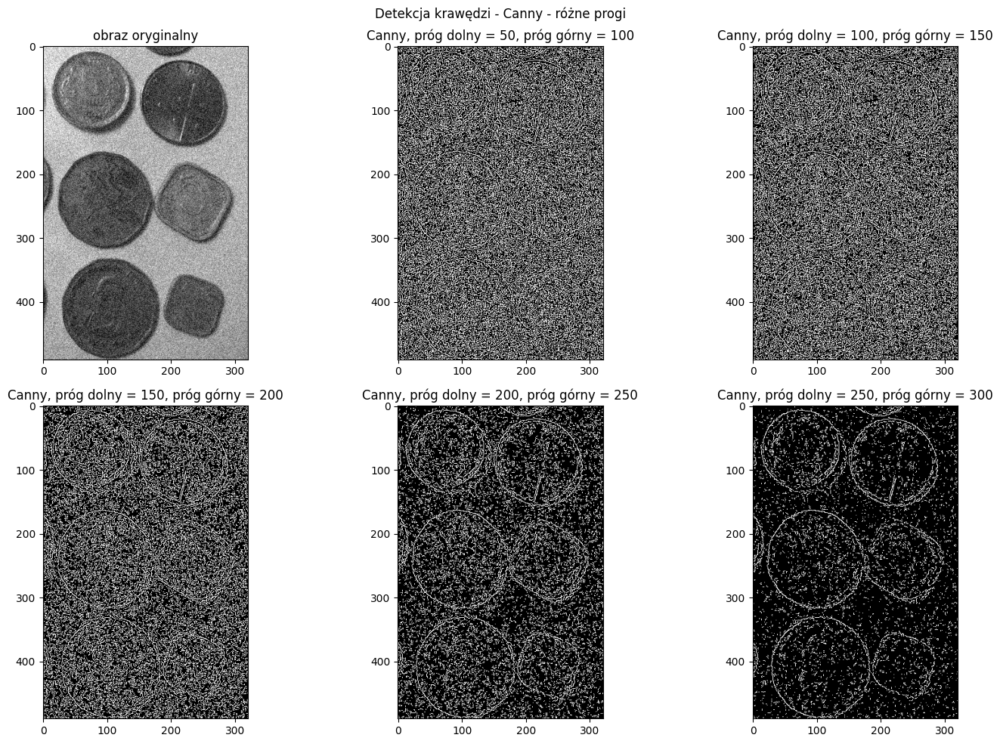

In [17]:
import cv2
import matplotlib.pyplot as plt

coins_noise = cv2.imread("Monety_szare_szum.bmp", cv2.IMREAD_GRAYSCALE)

f, ((a1, a2, a3), (a4, a5, a6)) = plt.subplots(2, 3)
f.suptitle('Detekcja krawędzi - Canny - różne progi')
f.set_figwidth(15)
f.set_figheight(10)

a1.imshow(coins_noise, cmap='gray')
a1.set_title('obraz oryginalny')

thresholds = [(50, 100), (100, 150), (150, 200), (200, 250), (250, 300)]
axes = [a2, a3, a4, a5, a6]

for ax, (t1, t2) in zip(axes, thresholds):
    edges = cv2.Canny(image=coins_noise, threshold1=t1, threshold2=t2, apertureSize=3)
    ax.imshow(edges, cmap='gray')
    ax.set_title(f'Canny, próg dolny = {t1}, próg górny = {t2}')
plt.tight_layout()
plt.show()

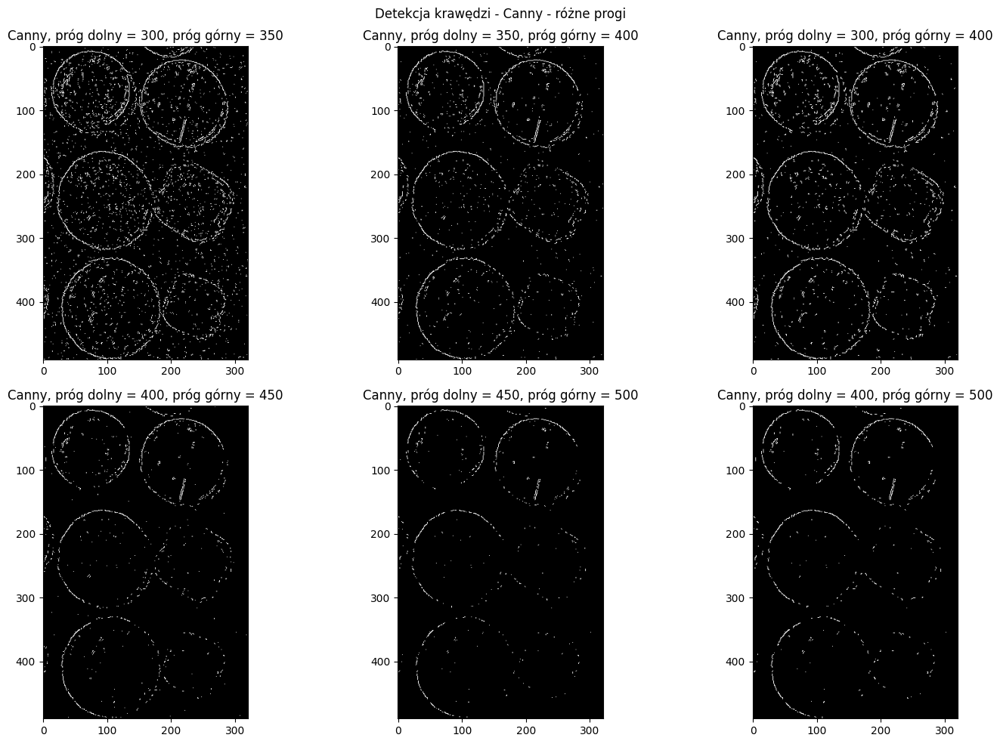

In [18]:
import cv2
import matplotlib.pyplot as plt

# Load the image
coins_noise = cv2.imread("Monety_szare_szum.bmp", cv2.IMREAD_GRAYSCALE)

# Create subplots
f, ((a1, a2, a3), (a4, a5, a6)) = plt.subplots(2, 3)
f.suptitle("Detekcja krawędzi - Canny - różne progi")

f.set_figwidth(15)
f.set_figheight(10)

thresholds = [
    (300, 350),
    (350, 400),
    (300, 400),
    (400, 450),
    (450, 500),
    (400, 500),
]
axes = [a1, a2, a3, a4, a5, a6]

for ax, (t1, t2) in zip(axes, thresholds):
    edges = cv2.Canny(image=coins_noise, threshold1=t1, threshold2=t2, apertureSize=3)
    ax.imshow(edges, cmap="gray")
    ax.set_title(f"Canny, próg dolny = {t1}, próg górny = {t2}")
plt.tight_layout()
plt.show()

Badanie ustalonej wartośc progu dla różnych sposobów redukcji szumu

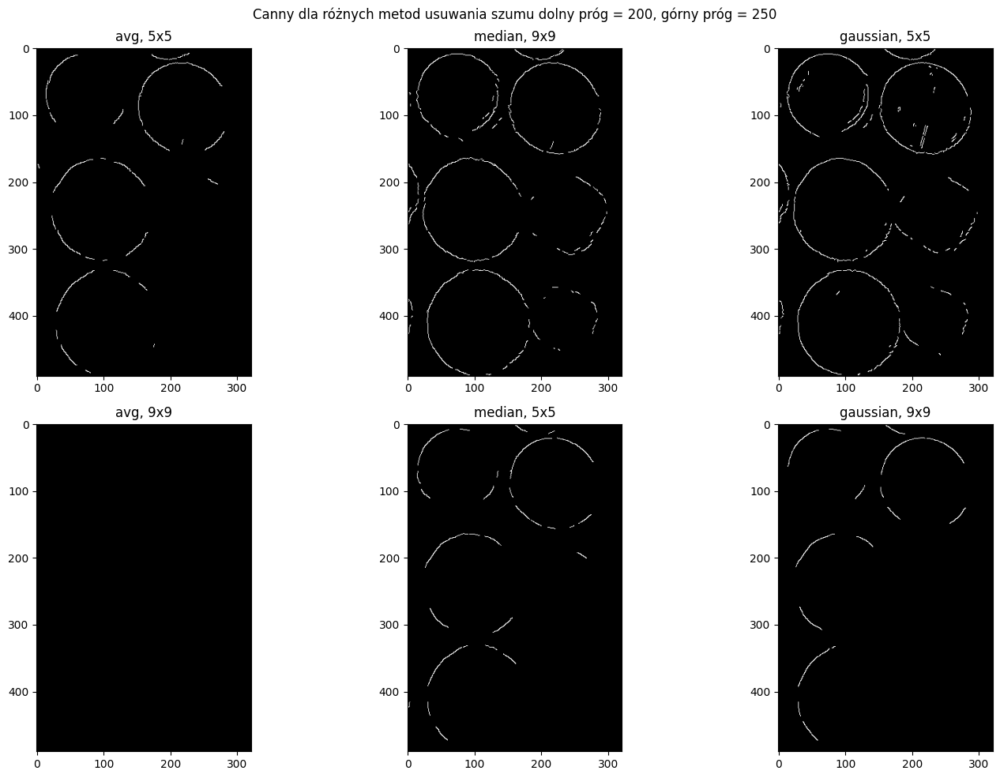

In [123]:
t1 = 200
t2 = 250


coins_noise = cv2.imread("Monety_szare_szum.bmp", cv2.IMREAD_GRAYSCALE)

f, ((a1, a2, a3), (a4, a5, a6)) = plt.subplots(2, 3)
f.suptitle(
    f"Canny dla różnych metod usuwania szumu dolny próg = {t1}, górny próg = {t2}"
)
f.set_figwidth(15)
f.set_figheight(10)
avg_denoised_1 = cv2.blur(coins_noise, (5, 5))
avg_denoised_2 = cv2.blur(coins_noise, (9, 9))
median_denoised_1 = cv2.medianBlur(coins_noise, 5)
median_denoised_2 = cv2.medianBlur(coins_noise, 9)
gaussian_denoised_1 = cv2.GaussianBlur(coins_noise, (5, 5), 0)
gaussian_denoised_2 = cv2.GaussianBlur(coins_noise, (9, 9), 0)


edges_avg_1 = cv2.Canny(avg_denoised_1, t1, t2)
edges_avg_2 = cv2.Canny(avg_denoised_2, t1, t2)
edges_median_1 = cv2.Canny(median_denoised_1, t1, t2)
edges_median_2 = cv2.Canny(median_denoised_2, t1, t2)
edges_gaussian_1 = cv2.Canny(gaussian_denoised_1, t1, t2)
edges_gaussian_2 = cv2.Canny(gaussian_denoised_2, t1, t2)

axes = [a1, a2, a3, a4, a5, a6]
images = [
    edges_avg_1,
    edges_median_1,
    edges_gaussian_1,
    edges_avg_2,
    edges_median_2,
    edges_gaussian_2,
]
titles = [
    "avg, 5x5",
    "median, 9x9",
    "gaussian, 5x5",
    "avg, 9x9",
    "median, 5x5",
    "gaussian, 9x9",
]

for ax, image, title in zip(axes, images, titles):
    ax.imshow(image, cmap="gray")
    ax.set_title(title)
f.tight_layout()
plt.show()

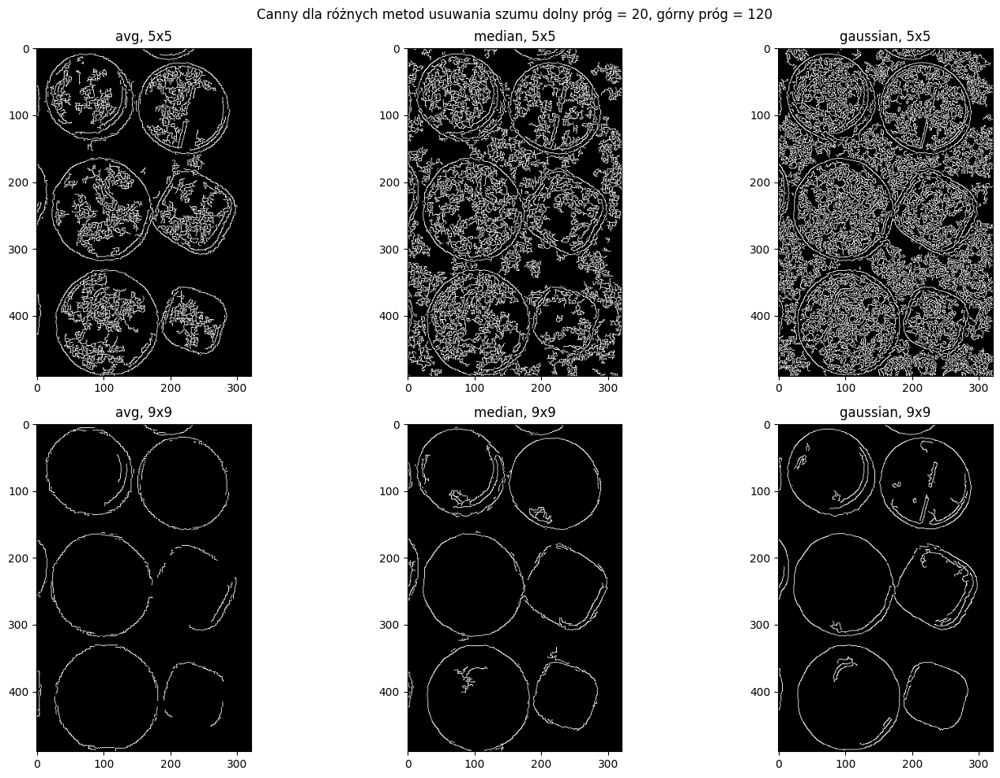

In [124]:
t1 = 20
t2 = 120

# Load the image
coins_noise = cv2.imread("Monety_szare_szum.bmp", cv2.IMREAD_GRAYSCALE)

# Create subplots

f, ((a1, a2, a3), (a4, a5, a6)) = plt.subplots(2, 3)
f.suptitle(f"Canny dla różnych metod usuwania szumu dolny próg = {t1}, górny próg = {t2}")

f.set_figwidth(15)
f.set_figheight(10)
# Apply different denoising methods
avg_denoised_1 = cv2.blur(coins_noise, (5, 5))
avg_denoised_2 = cv2.blur(coins_noise, (9, 9))
median_denoised_1 = cv2.medianBlur(coins_noise, 5)
median_denoised_2 = cv2.medianBlur(coins_noise, 9)
gaussian_denoised_1 = cv2.GaussianBlur(coins_noise, (5, 5), 0)
gaussian_denoised_2 = cv2.GaussianBlur(coins_noise, (9, 9), 0)


# Apply Canny filter with t1 and t2 parameters
edges_avg_1 = cv2.Canny(avg_denoised_1, t1, t2)
edges_avg_2 = cv2.Canny(avg_denoised_2, t1, t2)
edges_median_1 = cv2.Canny(median_denoised_1, t1, t2)
edges_median_2 = cv2.Canny(median_denoised_2, t1, t2)
edges_gaussian_1 = cv2.Canny(gaussian_denoised_1, t1, t2)
edges_gaussian_2 = cv2.Canny(gaussian_denoised_2, t1, t2)

# Display the results

axes = [a1, a2, a3, a4, a5, a6]
images = [
    edges_avg_1,
    edges_median_1,
    edges_gaussian_1,
    edges_avg_2,
    edges_median_2,
    edges_gaussian_2,
]
titles = [
    "avg, 5x5",
    "median, 5x5",
    "gaussian, 5x5",
    "avg, 9x9",
    "median, 9x9",
    "gaussian, 9x9",
]

for ax, image, title in zip(axes, images, titles):
    ax.imshow(image, cmap="gray")
    ax.set_title(title)

f.tight_layout()
plt.show()

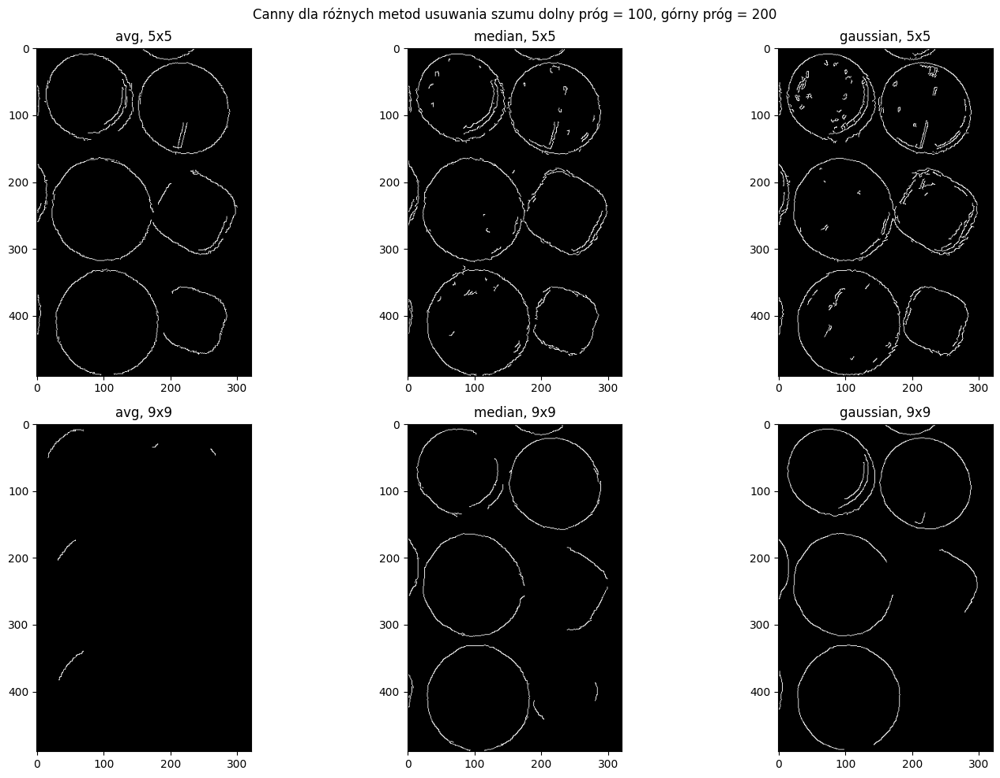

In [125]:
t1 = 100
t2 = 200

# Load the image
coins_noise = cv2.imread("Monety_szare_szum.bmp", cv2.IMREAD_GRAYSCALE)

# Create subplots

f, ((a1, a2, a3), (a4, a5, a6)) = plt.subplots(2, 3)
f.suptitle(
    f"Canny dla różnych metod usuwania szumu dolny próg = {t1}, górny próg = {t2}"
)

f.set_figwidth(15)
f.set_figheight(10)
# Apply different denoising methods
avg_denoised_1 = cv2.blur(coins_noise, (5, 5))
avg_denoised_2 = cv2.blur(coins_noise, (9, 9))
median_denoised_1 = cv2.medianBlur(coins_noise, 5)
median_denoised_2 = cv2.medianBlur(coins_noise, 9)
gaussian_denoised_1 = cv2.GaussianBlur(coins_noise, (5, 5), 0)
gaussian_denoised_2 = cv2.GaussianBlur(coins_noise, (9, 9), 0)


# Apply Canny filter with t1 and t2 parameters
edges_avg_1 = cv2.Canny(avg_denoised_1, t1, t2)
edges_avg_2 = cv2.Canny(avg_denoised_2, t1, t2)
edges_median_1 = cv2.Canny(median_denoised_1, t1, t2)
edges_median_2 = cv2.Canny(median_denoised_2, t1, t2)
edges_gaussian_1 = cv2.Canny(gaussian_denoised_1, t1, t2)
edges_gaussian_2 = cv2.Canny(gaussian_denoised_2, t1, t2)

# Display the results

axes = [a1, a2, a3, a4, a5, a6]
images = [
    edges_avg_1,
    edges_median_1,
    edges_gaussian_1,
    edges_avg_2,
    edges_median_2,
    edges_gaussian_2,
]
titles = [
    "avg, 5x5",
    "median, 5x5",
    "gaussian, 5x5",
    "avg, 9x9",
    "median, 9x9",
    "gaussian, 9x9",
]

for ax, image, title in zip(axes, images, titles):
    ax.imshow(image, cmap="gray")
    ax.set_title(title)

f.tight_layout()
plt.show()

---

##### Zad. 3: Wyrównanie histogramu

Wyrównaj histogram obrazu `coins_noise`. Wyniki zaprezentuj za pomocą obrazów i towarzyszących im histogramów. Oceń uzyskaną zmianę w obrazie.

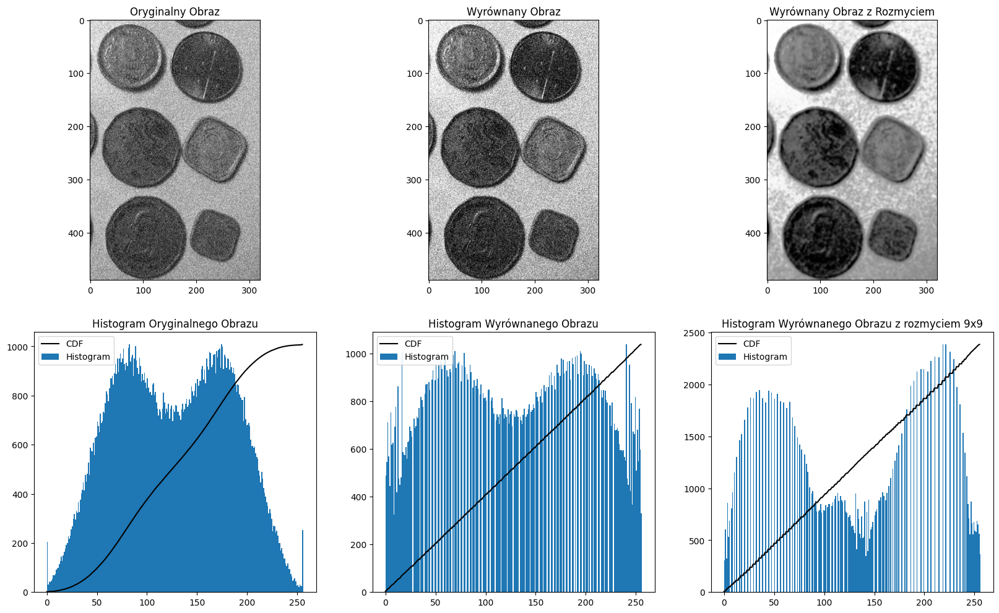

In [21]:

image_blur = cv2.GaussianBlur(coins_noise, (9,9), 0)
# Wykonaj wyrównanie histogramu
equalized_image = cv2.equalizeHist(coins_noise)

equalized_image_blur = cv2.equalizeHist(image_blur)


# Oblicz histogramy
hist_original, bins_original = np.histogram(coins_noise.ravel(), bins=256, range=[0, 256])
hist_equalized, bins_equalized = np.histogram(equalized_image.ravel(), bins=256, range=[0, 256])
hist_equalized_blur, bins_equalized_blur = np.histogram(equalized_image_blur.ravel(), bins=256, range=[0, 256])

# Oblicz skumulowane funkcje rozkładu (CDF)
cdf_original = hist_original.cumsum()
# Normalizacja CDF oryginalnego obrazu do zakresu [0, max(hist_original)]
cdf_original_normalized = cdf_original * hist_original.max() / cdf_original.max()

cdf_equalized = hist_equalized.cumsum()
# Normalizacja CDF wyrównanego obrazu do zakresu [0, max(hist_equalized)]
cdf_equalized_normalized = cdf_equalized * hist_equalized.max() / cdf_equalized.max()

# Normalizacja CDF oryginalnego obrazu do zakresu [0, max(hist_original)]
cdf_equalized_blur = hist_equalized_blur.cumsum()
cdf_equalized_blur_normalized = cdf_equalized_blur * hist_equalized_blur.max() / cdf_equalized_blur.max()


# Wyświetl oryginalny i wyrównany obraz
f, axarr = plt.subplots(2, 3, figsize=(20, 12))

# Wyświetlenie oryginalnego obrazu
axarr[0, 0].imshow(coins_noise, cmap='gray')
axarr[0, 0].set_title('Oryginalny Obraz')

# Wyświetlenie wyrównanego obrazu
axarr[0, 1].imshow(equalized_image, cmap='gray')
axarr[0, 1].set_title('Wyrównany Obraz')

# Wyświetlenie wyrównanego obrazu z rozmyciem
axarr[0, 2].imshow(equalized_image_blur, cmap='gray')
axarr[0, 2].set_title('Wyrównany Obraz z Rozmyciem')

# Wyświetlenie histogramu oryginalnego obrazu
axarr[1, 0].hist(coins_noise.ravel(), bins=256, range=[0, 256])
axarr[1, 0].set_title('Histogram Oryginalnego Obrazu')
# Dodanie skumulowanej funkcji rozkładu (CDF) do histogramu
axarr[1, 0].plot(cdf_original_normalized, color='black')
axarr[1, 0].legend(['CDF', 'Histogram'], loc='upper left')

# Wyświetlenie histogramu wyrównanego obrazu
axarr[1, 1].hist(equalized_image.ravel(), bins=256, range=[0, 256])
axarr[1, 1].set_title('Histogram Wyrównanego Obrazu')
# Dodanie skumulowanej funkcji rozkładu (CDF) do histogramu
axarr[1, 1].plot(cdf_equalized_normalized, color='black')
axarr[1, 1].legend(['CDF', 'Histogram'], loc='upper left')

# Wyświetlenie histogramu wyrównanego obrazu z rozmyciem
axarr[1, 2].hist(equalized_image_blur.ravel(), bins=256, range=[0, 256])
axarr[1, 2].set_title('Histogram Wyrównanego Obrazu z rozmyciem 9x9x')
# Dodanie skumulowanej funkcji rozkładu (CDF) do histogramu
axarr[1, 2].plot(cdf_equalized_blur_normalized, color='black')
axarr[1, 2].legend(['CDF', 'Histogram'], loc='upper left')

# Wyświetlenie wykresów
plt.show()


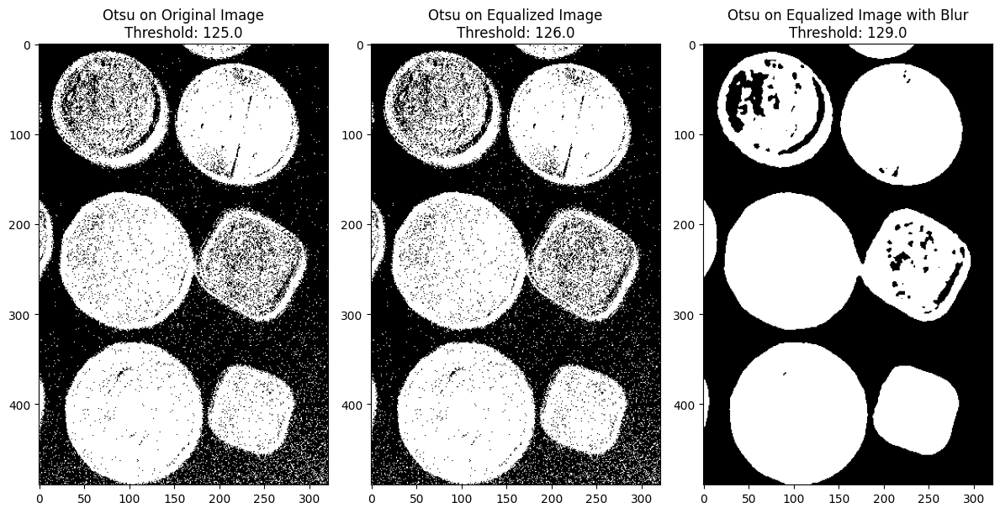

In [25]:
otsu_threshold_original, otsu_original = cv2.threshold(
    coins_noise, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

otsu_threshold_equalized, otsu_equalized = cv2.threshold(
    equalized_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

otsu_threshold_equalized_blur, otsu_equalized_blur = cv2.threshold(
    equalized_image_blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(otsu_original, cmap='gray')
plt.title(f'Otsu on Original Image\nThreshold: {otsu_threshold_original}')

plt.subplot(1, 3, 2)
plt.imshow(otsu_equalized, cmap='gray')
plt.title(f'Otsu on Equalized Image\nThreshold: {otsu_threshold_equalized}')

plt.subplot(1, 3, 3)
plt.imshow(otsu_equalized_blur, cmap='gray')
plt.title(f'Otsu on Equalized Image with Blur\nThreshold: {otsu_threshold_equalized_blur}')

plt.tight_layout()
plt.show()

---

##### Zad. 4: Transformacja do rozkładu docelowego

Dla obrazu `hare_gray` wykonaj transformację do wybranego (założonego przez siebie) rozkładu docelowego, tak aby zmaksymalizować możliwość wyodrębnienia obiektu z otoczenia (zająca) przy użyciu algorytmu binaryzacji Otsu. Zacznij od zastanowienia się nad doborem rozkładu docelowego (możesz zbadać zachowanie transformacji w zależności od wybranego rozkładu).

Podpowiedź: przedstawiona we wstępie teoretycznym transformacja obu rozkładów (źródłowego i docelowego) do rozkładu jednostajnego _nie musi_ zostać faktycznie wykonana (dlatego nie używaj w zadaniu funkcji `cv2.equalizeHist`)! Wystarczy porównywanie ze sobą wartości ze skumulowanych rozkładów (rysunek 3).

Podpowiedź 2: [cv2.LUT](https://docs.opencv.org/4.5.3/d2/de8/group__core__array.html#gab55b8d062b7f5587720ede032d34156f)

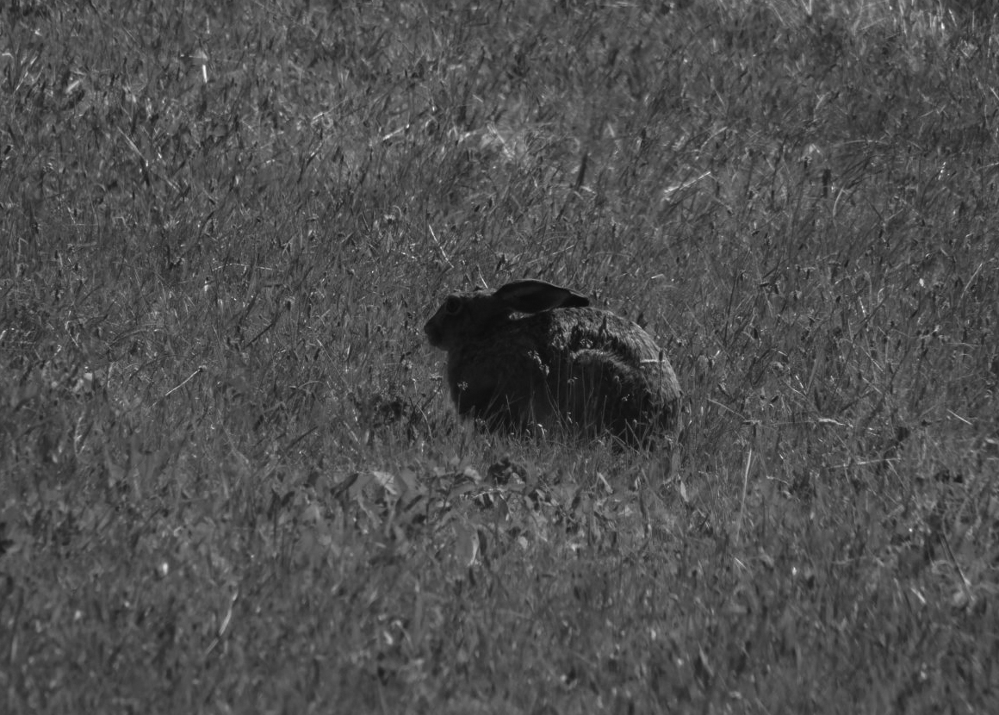

In [126]:
hare_gray = cv2.imread('Zajac.jpg', cv2.IMREAD_GRAYSCALE)
Image.fromarray(hare_gray)

Rozwiązanie:

In [127]:
num_pixels = hare_gray.shape[0] * hare_gray.shape[1]
num_pixels

962800

In [128]:
num_n1 = 30_000

desired_hist = np.concatenate(
    [
        np.random.normal(0, 1, num_n1),
        np.random.normal(255, 50, num_pixels - num_n1),
    ]
)


In [51]:
def match_histograms(src_image, dst_image):
    # Oblicz histogram i CDF (skumulowaną funkcję rozkładu) obrazu źródłowego
    src_hist, _ = np.histogram(src_image.ravel(), bins=256, range=[0, 256])
    src_cdf = src_hist.cumsum()
    src_cdf_normalized = src_cdf * (255 / src_cdf[-1])  # Normalizacja do zakresu [0, 255]

    # Oblicz histogram i CDF obrazu docelowego
    dst_hist, _ = np.histogram(dst_image.ravel(), bins=256, range=[0, 256])
    dst_cdf = dst_hist.cumsum()
    dst_cdf_normalized = dst_cdf * (255 / dst_cdf[-1])  # Normalizacja do zakresu [0, 255]

    # Utwórz LUT (Look-Up Table) na podstawie CDF
    lut = np.zeros(256, dtype=np.uint8)
    g_j = 0
    for g_i in range(256):
        # Znajdź najbliższą wartość w CDF obrazu docelowego, która jest większa lub równa wartości w CDF obrazu źródłowego
        while g_j < 255 and dst_cdf_normalized[g_j] < src_cdf_normalized[g_i]:
            g_j += 1
        lut[g_i] = g_j

    # Zastosuj LUT do obrazu źródłowego
    matched_image = cv2.LUT(src_image, lut)

    return matched_image, (lut, dst_cdf_normalized)

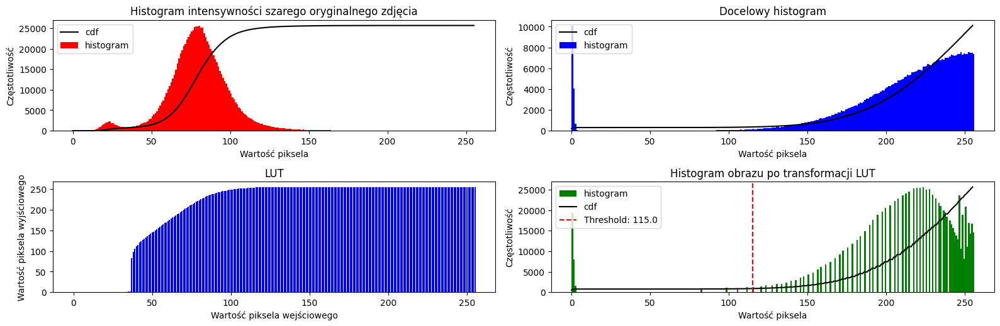

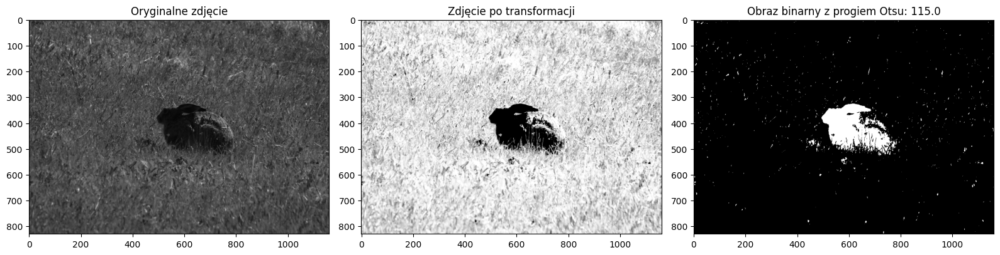

In [129]:
transformed_image, (lut, dst_cdf_normalized) = match_histograms(hare_gray, desired_hist)


otsu_threshold, otsu_thresholded = cv2.threshold(
    transformed_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

plt.figure(figsize=(16, 10))

# 1. Histogram oryginalnego obrazu
plt.subplot(4, 2, 1)
hist_original, bins_original = np.histogram(hare_gray.ravel(), bins=256, range=[0, 256])
cdf_original = np.cumsum(hist_original / np.sum(hist_original))
plt.hist(hare_gray.ravel(), bins=256, range=[0, 256], color='red')
plt.plot(cdf_original * np.max(hist_original), color='black')
plt.title('Histogram intensywności szarego oryginalnego zdjęcia')
plt.xlabel('Wartość piksela')
plt.ylabel('Częstotliwość')
plt.legend(('cdf', 'histogram'), loc='upper left')

# 2. Wykres LUT (docelowy histogram)
plt.subplot(4, 2, 2)
hist_desired, bins_desired = np.histogram(desired_hist, 256, [0, 256])
cdf_desired = np.cumsum(hist_desired / np.sum(hist_desired))
plt.hist(desired_hist, 256, [0, 256], color="b")
plt.plot(cdf_desired * np.max(hist_desired), color='black')
plt.title("Docelowy histogram")
plt.xlabel('Wartość piksela')
plt.ylabel("Częstotliwość")
plt.legend(('cdf', 'histogram'), loc='upper left')

# 3. Wykres LUT
plt.subplot(4, 2, 3)
plt.bar(range(len(lut)), lut, color="blue")
plt.title('LUT')
plt.xlabel('Wartość piksela wejściowego')
plt.ylabel('Wartość piksela wyjściowego')

# 4. Histogram obrazu po transformacji
plt.subplot(4, 2, 4)
hist_transformed, bins_transformed = np.histogram(transformed_image.ravel(), bins=256, range=[0, 256])
cdf_transformed = np.cumsum(hist_transformed / np.sum(hist_transformed))
plt.hist(transformed_image.ravel(), bins=256, range=[0, 256], color="green", label='histogram')
plt.plot(cdf_transformed * np.max(hist_transformed), color='black', label='cdf')
plt.axvline(x=otsu_threshold, color="red", linestyle="--", label=f"Threshold: {otsu_threshold}")
plt.title('Histogram obrazu po transformacji LUT')
plt.xlabel('Wartość piksela')
plt.ylabel('Częstotliwość')
plt.legend()
# Wyświetlenie wykresów
plt.tight_layout()
plt.show()

plt.figure(figsize=(16, 6))
# 5. Obraz oryginalny
plt.subplot(1, 3, 1)
plt.imshow(hare_gray, cmap='gray')
plt.title('Oryginalne zdjęcie')

# 6. Obraz po transformacji
plt.subplot(1, 3, 2)
plt.imshow(transformed_image, cmap='gray')
plt.title('Zdjęcie po transformacji')

# 7. Obraz binarny z progiem Otsu
plt.subplot(1, 3, 3)
plt.imshow(otsu_thresholded, cmap="gray")
plt.title(f'Obraz binarny z progiem Otsu: {otsu_threshold}')


plt.tight_layout()
plt.show()

## Wrapper

In [70]:
def match_histogram_wrapper(src_image, desired_hist, title):
    transformed_image, (lut, dst_cdf_normalized) = match_histograms(
        src_image, desired_hist
    )

    otsu_threshold, otsu_thresholded = cv2.threshold(
        transformed_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
    )

    plt.figure(figsize=(16, 10))

    # 1. Histogram oryginalnego obrazu
    plt.subplot(4, 2, 1)
    hist_original, bins_original = np.histogram(src_image.ravel(), bins=256, range=[0, 256])
    cdf_original = np.cumsum(hist_original / np.sum(hist_original))
    plt.hist(src_image.ravel(), bins=256, range=[0, 256], color="red")
    plt.plot(cdf_original * np.max(hist_original), color="black")
    plt.title("Histogram intensywności szarego oryginalnego zdjęcia")
    plt.xlabel("Wartość piksela")
    plt.ylabel("Częstotliwość")
    plt.legend(("cdf", "histogram"), loc="upper left")

    # 2. Wykres LUT (docelowy histogram)
    plt.subplot(4, 2, 2)
    hist_desired, bins_desired = np.histogram(desired_hist, 256, [0, 256])
    cdf_desired = np.cumsum(hist_desired / np.sum(hist_desired))
    plt.hist(desired_hist, 256, [0, 256], color="b")
    plt.plot(cdf_desired * np.max(hist_desired), color="black")
    plt.title("Docelowy histogram")
    plt.xlabel("Wartość piksela")
    plt.ylabel("Częstotliwość")
    plt.legend(("cdf", "histogram"), loc="upper left")

    # 3. Wykres LUT
    plt.subplot(4, 2, 3)
    plt.bar(range(len(lut)), lut, color="blue")
    plt.title("LUT")
    plt.xlabel("Wartość piksela wejściowego")
    plt.ylabel("Wartość piksela wyjściowego")

    # 4. Histogram obrazu po transformacji
    plt.subplot(4, 2, 4)
    hist_transformed, bins_transformed = np.histogram(
        transformed_image.ravel(), bins=256, range=[0, 256]
    )
    cdf_transformed = np.cumsum(hist_transformed / np.sum(hist_transformed))
    plt.hist(
        transformed_image.ravel(),
        bins=256,
        range=[0, 256],
        color="green",
        label="histogram",
    )
    plt.plot(cdf_transformed * np.max(hist_transformed), color="black", label="cdf")
    plt.axvline(
        x=otsu_threshold, color="red", linestyle="--", label=f"Threshold: {otsu_threshold}"
    )
    plt.title("Histogram obrazu po transformacji LUT")
    plt.xlabel("Wartość piksela")
    plt.ylabel("Częstotliwość")
    plt.legend()
    # Wyświetlenie wykresów
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(16, 6))
    # 5. Obraz oryginalny
    plt.subplot(1, 3, 1)
    plt.imshow(hare_gray, cmap="gray")
    plt.title("Oryginalne zdjęcie")

    # 6. Obraz po transformacji
    plt.subplot(1, 3, 2)
    plt.imshow(transformed_image, cmap="gray")
    plt.title("Zdjęcie po transformacji")

    # 7. Obraz binarny z progiem Otsu
    plt.subplot(1, 3, 3)
    plt.imshow(otsu_thresholded, cmap="gray")
    plt.title(f"Obraz binarny z progiem Otsu: {otsu_threshold}")

    plt.tight_layout()
    plt.show()



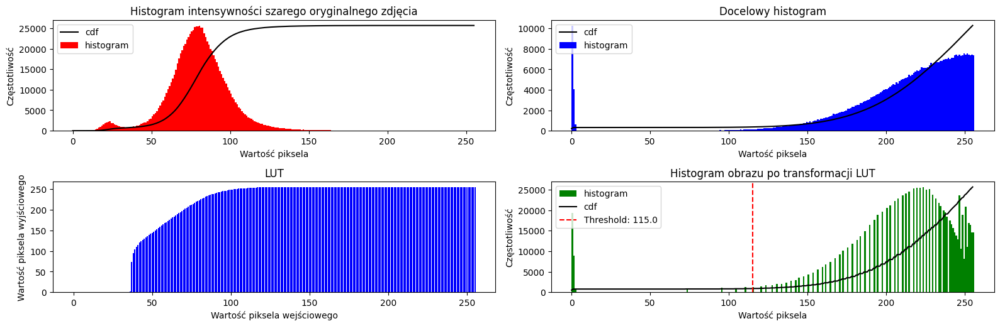

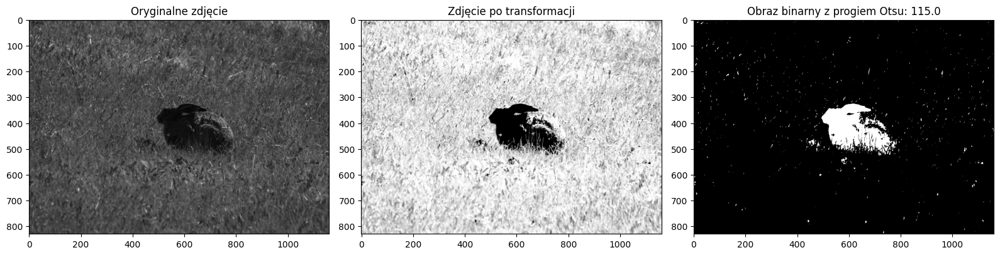

In [71]:
desired_hist = np.concatenate(
    [np.random.normal(0, 1, num_n1), np.random.normal(255, 50, num_pixels - num_n1)]
)
match_histogram_wrapper(hare_gray, desired_hist, "Bimodal")

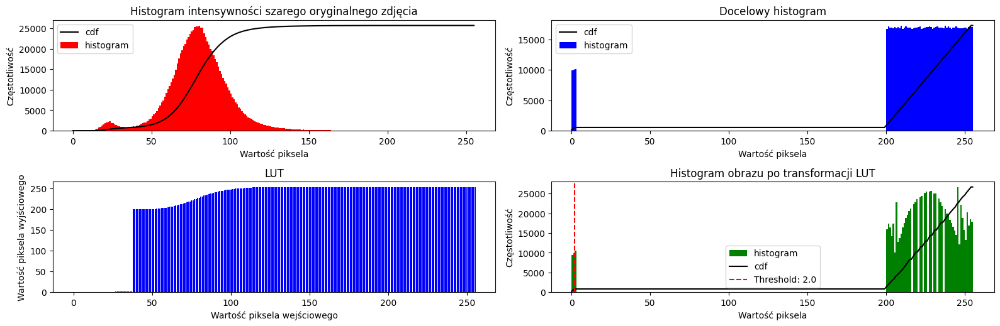

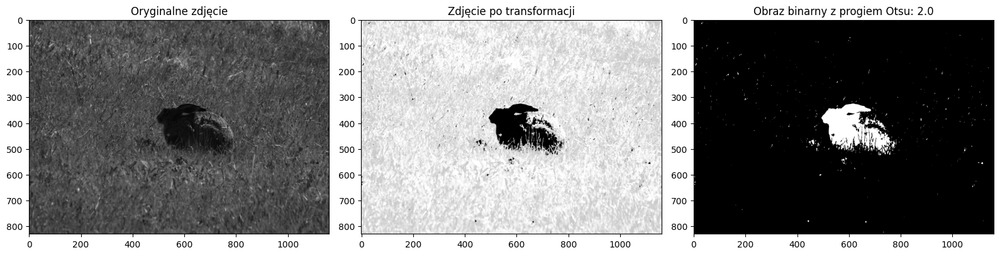

In [110]:
#pixels = 1_000_000
num_n1 = 30_000
hist_uni_uni = np.concatenate([
    np.random.uniform(0, 3, num_n1),
    np.random.uniform(200, 255, num_pixels - num_n1)
])
match_histogram_wrapper(hare_gray, hist_uni_uni, "Uniform")

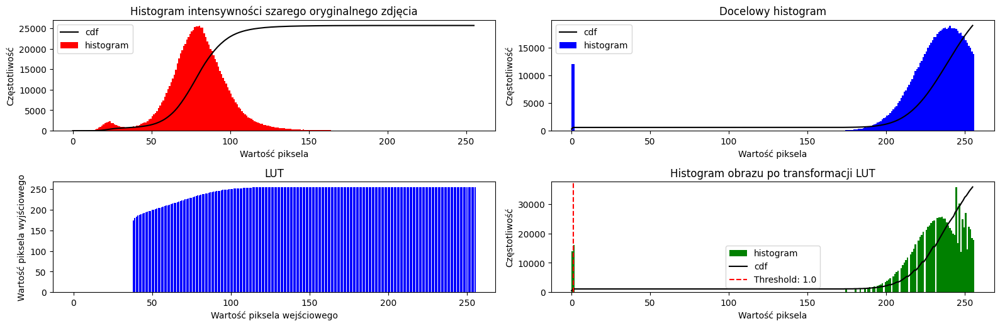

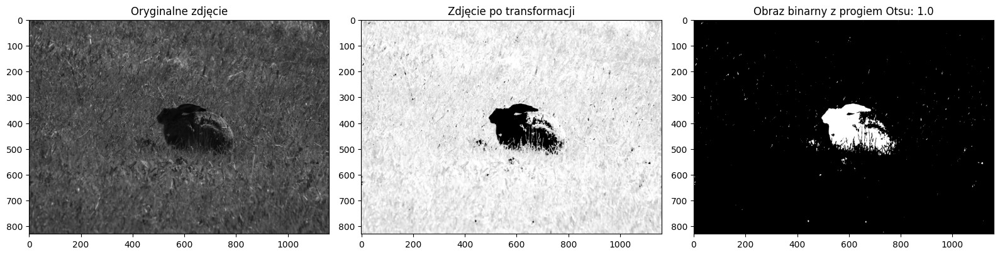

In [108]:
num_n1 = 24_000
hist_uni_norm = np.concatenate([
    np.random.uniform(0, 2, num_n1),
    np.random.normal(240, 20, num_pixels - num_n1)
])
match_histogram_wrapper(hare_gray, hist_uni_norm, "Uniform and Normal")

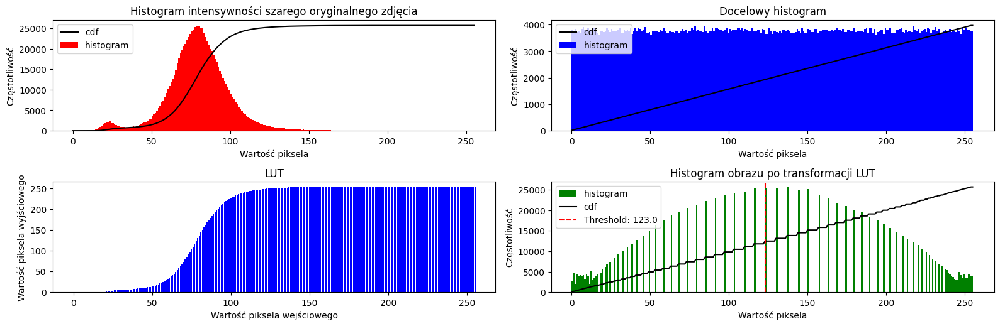

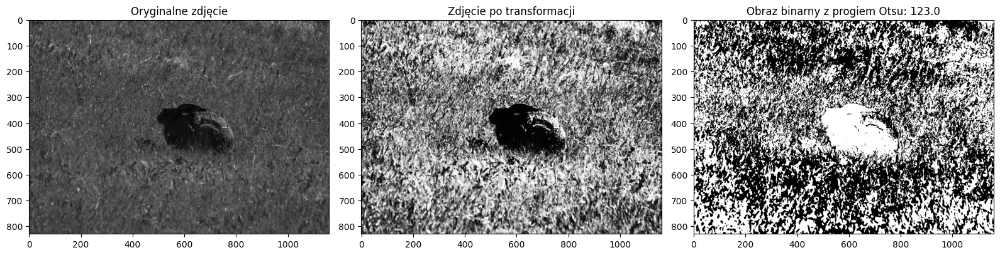

In [109]:
hist_uni = np.random.uniform(0, 255, num_pixels)
match_histogram_wrapper(hare_gray, hist_uni, "Uniform")
